<center><font size = "10"> Week 9 - Cells in Space  <center>
<center><font size = "8">Home work<center>

<font size = "3">Please, write your group number and the names and surnames of the group members here
<br>Group number: 3
<br>Group member1: Laura TESTA
<br>Group member2: Alice ALBRECHT
<br>Group member3: Clara LE DRAOULEC

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import neurom as nm
import numpy as np

## Optional. Placing cells in a cubic volume

<font size='3'>Define a cubic volume with the following dimensions: x = (2000, 5000), y = (2000, 5000), z = (-1000, 2000). Place the five morphologies assigned to your group (used in week7) in random positions inside the cube. Visualize the cells in the cube in three different planes: xy, xz and yz. 

## Ex2. 3D Rotaion around a vector

<font size='3'>To start of, compute a 2D rotation along the y axis on the inhibitory cells from your data set (week 7), the rotation angles should be: -90°, -180° and -270°. Plot the results in xy plane. Now compute a 3D rotation to align your pyramidal cells' z axis with the vector (3,4,5). [1.5 pts]

## 2D rotation along y axis


In [2]:
# Useful functions
def shift_morphology(morph,shift):
    morph2 = morph.transform(lambda p: p + shift)
    return morph2
       
def center_morphology(morph):
    center = morph.soma.center.copy()
    return shift_morphology(morph,-center)

# Poorman's plotting of morphologies
def plot_morphology(morph,name_morph, angle,  plane = 'XY',somaOnly = False):
    colors_dict={nm.BASAL_DENDRITE:'red', 
            nm.APICAL_DENDRITE:'green',
            nm.AXON:'blue',
            nm.SOMA:'black'}

    planes = { 'XY': [0,1], 'XZ': [0,2], 'YZ': [1,2], 'YX': [1,0], 'ZX': [2,0], 'ZY': [2,1] }
   
    if not somaOnly:
        for n in morph.neurites:
            pts = n.points[:,[0,1,2]]
            plt.scatter(pts[:,planes[plane][0]],pts[:,planes[plane][1]],s=1,c=colors_dict[n.type.value],marker='.')
    pts = morph.soma.center
    
    plt.scatter(pts[planes[plane][0]],pts[planes[plane][1]],c=colors_dict[nm.NeuriteType.soma.value],marker='D')
    plt.title('Morphology:  '+str(name_morph)+', rotation angle:  '+str(angle))
    
   
def plot_morphologies(morphlist, name_morph, angle=0, plane = 'XY',somaOnly = False):
    fig = plt.figure()
    fig.suptitle(plane)
    
    for i,m in enumerate(morphlist):
        plot_morphology(m, name_morph,angle,plane = plane, somaOnly = somaOnly)
        
# Rotation matrix around y axis, angle theta CCW (degrees)
def roty(theta):
    radtheta = theta * np.pi / 180.0 # in radians
    R = np.array([[np.cos(radtheta),0, np.sin(radtheta)],
                  [0,1,0],
                  [-np.sin(radtheta),0,np.cos(radtheta)]])
    return R
    
# apply rotation matrix R
def rotate_morphology(morph,R):
    morph = morph.transform(lambda p: R.dot(p.T).T)
    return morph

def roty_morphology(morph,theta):
    R = roty(theta)
    return rotate_morphology(morph,R)
       

In [3]:
# Load a morphology
morph_names_inh = ['Inh_1', 'Inh_2']
morph_1 = nm.load_morphology('Int_01.swc')
morph_2 = nm.load_morphology('Int_02.swc')

# Center morphology
morph_1=center_morphology(morph_1)
morph_2=center_morphology(morph_2)

### Morphologies before rotation

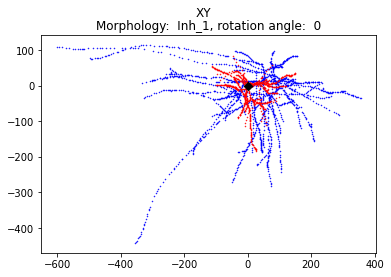

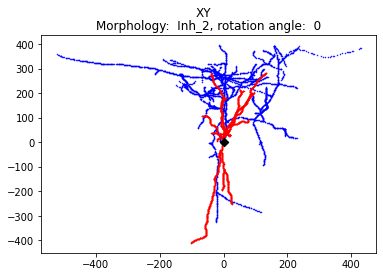

In [4]:
# plot morphologies
plot_morphologies([morph_1], 'Inh_1', angle=0)
plot_morphologies([morph_2], 'Inh_2', angle=0)

### Morphologies after rotation

In [5]:
# Verification of the y rotation matrix
R = roty(90)
# Test
R.dot([1,0,0]) # = [0,0,1]

array([ 6.123234e-17,  0.000000e+00, -1.000000e+00])

The rotation matrix rotate properly the vector, thus we can apply it to our morphologies.

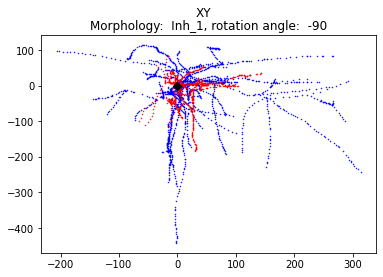

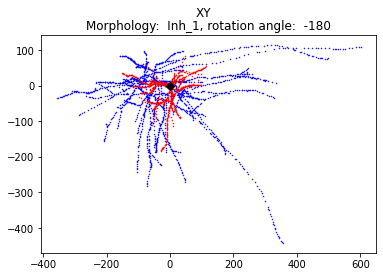

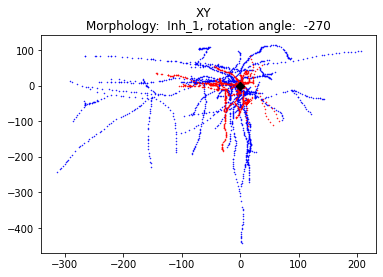

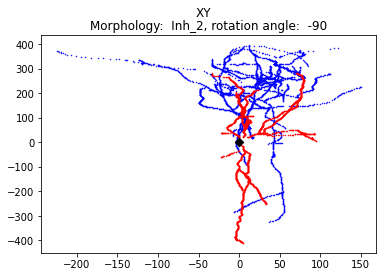

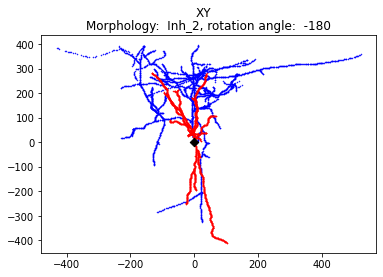

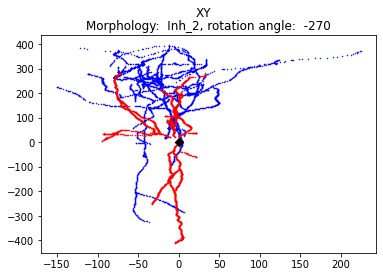

In [6]:
morphologies_inh = [morph_1,morph_2]
angles = [-90, -180, -270]
for i in range(len(morphologies_inh)):
    for angle in angles:
        morph=roty_morphology(morphologies_inh[i],angle)
        plot_morphologies([morph], morph_names_inh[i], angle)

## Alignement 3D rotation

In [7]:
# 3D alignement function
def align_morphology_Z(morph,axis):
    # Rotation matrix that aligns the Z axis [0,0,1] to an arbitrary vector b (other than Z or -Z)
    # From https://math.stackexchange.com/a/476311
    a = np.array([0,0,1])

    b = np.array(axis) # target axis
    b = b / np.linalg.norm(b) # make unit norm

    v = np.cross(a,b)     # a x b
    s = np.linalg.norm(v) # ||v|| = sin(theta)
    c = a.dot(b)          # a . b = cos(theta)

    # Skew-symmetric cross-product matrix
    V = np.zeros((3,3))
    V[0,1] = -v[2]
    V[1,0] =  v[2]
    V[0,2] =  v[1]
    V[2,0] = -v[1]
    V[1,2] = -v[0]
    V[2,1] =  v[0]

    # Rotation matrix
    R = np.diag((1.0,1.0,1.0))
    R += V
    R += V.dot(V) * (1.0 - c) / (s * s)

    # Test
    if not np.max(R.dot(a) - b) < 1E-12:
        raise ValueError('Matrix not good!')
    
    # Rotate morphology
    return rotate_morphology(morph,R)

In [8]:
# Load a morphology
morph_names_pyr = ['Pyr_01', 'Pyr_02', 'Pyr_03']
morph_3 = nm.load_morphology('Pyr_01.swc')
morph_4 = nm.load_morphology('Pyr_02.swc')
morph_5 = nm.load_morphology('Pyr_03.swc')

# Center morphology
morph_3=center_morphology(morph_3)
morph_4=center_morphology(morph_4)
morph_5=center_morphology(morph_5)

### Morphologies before alignment

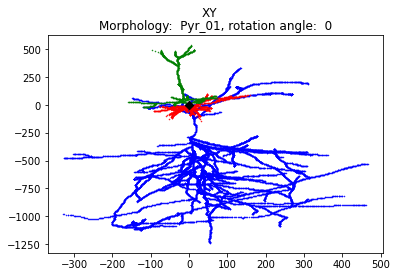

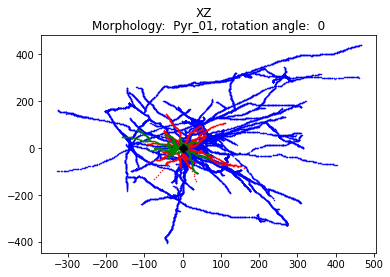

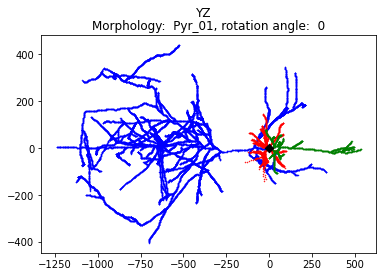

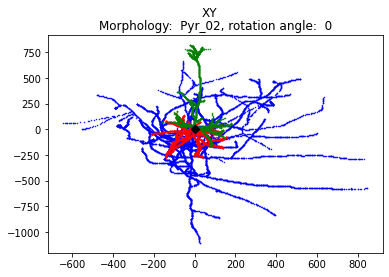

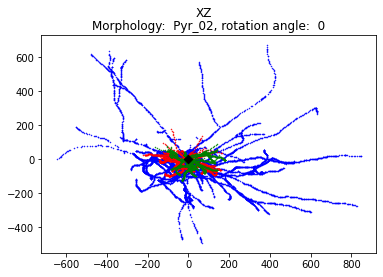

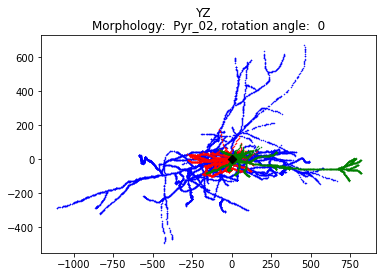

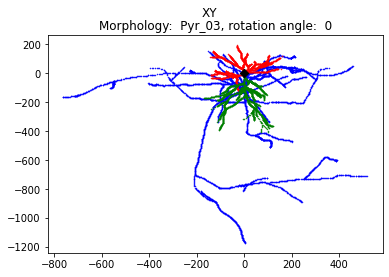

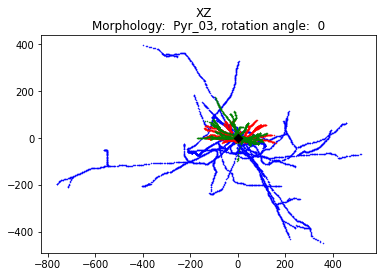

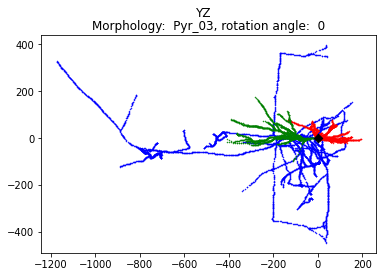

In [9]:
# Plot all three planes
morphologies_pyr = [morph_3, morph_4, morph_5]
for i in range(len(morphologies_pyr)):
    plot_morphologies([morphologies_pyr[i]],plane = 'XY', name_morph= morph_names_pyr[i])
    plot_morphologies([morphologies_pyr[i]],plane = 'XZ', name_morph= morph_names_pyr[i])
    plot_morphologies([morphologies_pyr[i]],plane = 'YZ', name_morph= morph_names_pyr[i])

### After 3D alignement on vector (3,4,5)

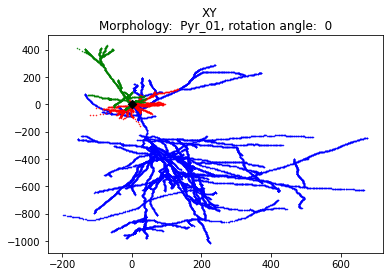

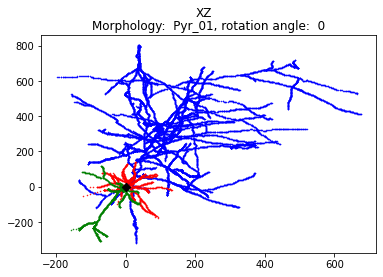

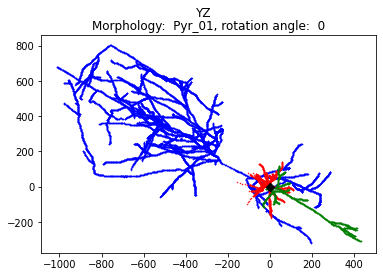

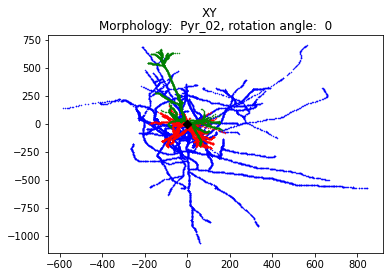

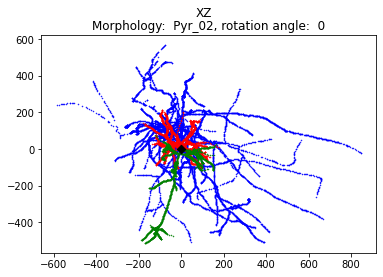

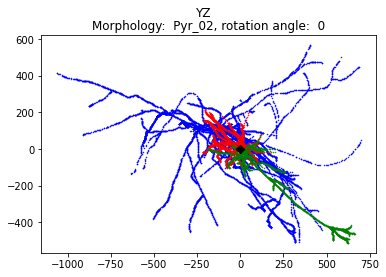

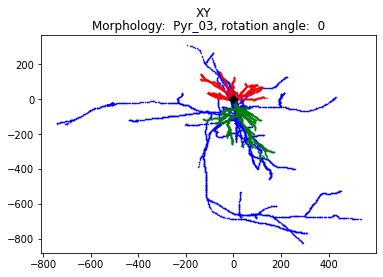

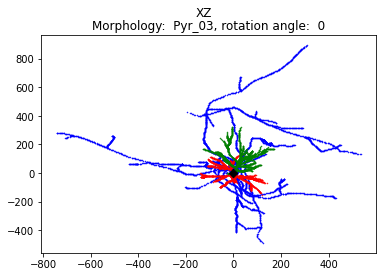

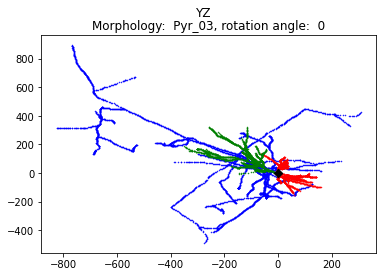

In [10]:
# alignement
# Plot all three planes
for i in range(len(morphologies_pyr)):
    morph=align_morphology_Z(morphologies_pyr[i],[3,4,5])
    plot_morphologies([morph],plane = 'XY', name_morph= morph_names_pyr[i])
    plot_morphologies([morph],plane = 'XZ', name_morph= morph_names_pyr[i])
    plot_morphologies([morph],plane = 'YZ', name_morph= morph_names_pyr[i])

## Ex3. Placing cells in a volume


<font size='3'> Define a hexagonal or cylindrical column of the same dimensions as in https://www.cell.com/fulltext/S0092-8674(15)01191-5  
<span>
<font size='3'>
Chose 5 points inside the volume to place your cells in, as follows: 
- inhibitory cells placed in randomly, witn no rotation or orientation rules applied
- pyramidal cells placed in the region of the volume corresponding to layers II-VI, with two of the cells with their apical dendrites facing up and one with its apical dendrites facing down
</span>

<font size='3'>Align the pyramidal cells' y axes with the column's vertical axis (larger values on the y axis corresponding to positions closer to the surface of the column). Plot the results in 2D, in all three planes, to show proper orientation. Also include a 3D plot of the column with all five cells placed in, inhibitory cells displayed in red and pyramidal ones in blue, magenta and cyan, respectively.  [2 pts]

### 1. We define the cylindrical column volume thanks to the dimensions given by the figure 3 of the paper indicated above:
- rayon = 210µm
- total height = 2082µm
- heigh layer I = 165µm -> height (layer II-VI) = 2082µm - 165µm = 1917µm

### 2. Place inhibitory cells

For this part, we define a cylindrical column volume thanks to a radius and a height. We assume the rotation axis of this cylinder to be the Z axis; the (0, 0, 0) coordinate corresponds to the center of the bottom disk of the cylider. In the variable "volume_inh", we stock the radius of our cylinder, the theta angle correpsonding to en entire circle ($\theta = 2\pi$) and the height of the cylinder. Then, to delimitated the X and Y maximum possible positions, we use the fact that $x=r*cos(\theta)$ and $y=r*sin(\theta)$ for a circle. Now we generate random values in this volume that coresponds to the position the soma of our 2 inihibitory cells. We plot the 2 inhibitory cells to check that there is no issue.

In [51]:
volume_inh = [210, 2*np.pi, 2082] # max_radius, max_theta angle (all cercle), max_height

# Create an array 2x3 with random value between 0 and 1
# two rows corresponding to the two inihibitor cells
# first and second columns use for the radius and angle theta respectively (X and Y position)
# third column uses for the height (Z position)
rng = np.random.default_rng()
pos_inh = rng.random((2,3))
                     
pos_inh[:,0] = (pos_inh[:,0] * volume_inh[0]) * np.cos(pos_inh[:,1] * volume_inh[1]) # position X                    
pos_inh[:,1] = (pos_inh[:,1] * volume_inh[0]) * np.sin(pos_inh[:,1] * volume_inh[1]) # position Y                    
pos_inh[:,2] = pos_inh[:,2] * volume_inh[2] # position Z

pos_inh

array([[ 200.0418999 ,    1.72996672, 1162.29070737],
       [ -21.71655846,   57.87466321,  319.98198789]])

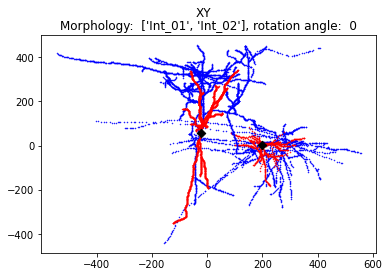

In [52]:
morph_files_inh = ['Int_01.swc','Int_02.swc']
morphs_inh = [nm.load_morphology(x) for x in morph_files_inh]

# place all morphologies
for i,m in enumerate(morphs_inh):
    m=center_morphology(m)
    m=shift_morphology(m,pos_inh[i])
    morphs_inh[i]=m

# Add (somaOnly = True) as parameter to see only the soma
plot_morphologies(morphs_inh,plane = 'XY', name_morph=['Int_01','Int_02']) 

### 3. Place pyramidal cells
For the pyramidal cells we do exactly the same process than above but reduce the height to ensure that the soma are not in the first layer but well comprised in layer II-VI. 

In [53]:
volume_pyr = [210, 2*np.pi, 1917] # max_radius, max_theta angle, max_height

# Create an array 3x3 with random value between 0 and 1
# three rows corresponding to the three pyramidal cells
# first and second columns use for the radius and angle theta respectively (X aand Y position)
# third column uses for the height (Z position)
rng = np.random.default_rng()
pos_pyr = rng.random((3,3))
                     
pos_pyr[:,0] = (pos_pyr[:,0] * volume_pyr[0]) * np.cos(pos_pyr[:,1] * volume_pyr[1]) # position X                    
pos_pyr[:,1] = (pos_pyr[:,1] * volume_pyr[0]) * np.sin(pos_pyr[:,1] * volume_pyr[1]) # position Y                    
pos_pyr[:,2] = pos_pyr[:,2] * volume_pyr[2] # position Z

pos_pyr

array([[ 8.22723881e+01, -6.39721921e-01,  1.18256216e+03],
       [ 7.61756902e+01,  1.21350913e+01,  1.49606150e+03],
       [ 1.55303720e+02, -7.64172208e+01,  1.13254508e+03]])

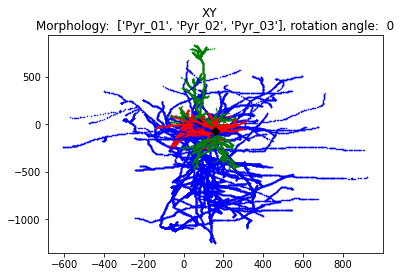

In [54]:
morph_files_pyr = ['Pyr_01.swc','Pyr_02.swc', 'Pyr_03.swc']
morphs_pyr = [nm.load_morphology(x) for x in morph_files_pyr ]

# place all morphologies
for i,m in enumerate(morphs_pyr ):
    m=center_morphology(m)
    m=shift_morphology(m,pos_pyr[i])
    morphs_pyr [i]=m
    
# Add (somaOnly = True) as parameter to see only the soma
plot_morphologies(morphs_pyr,plane = 'XY', name_morph=['Pyr_01','Pyr_02','Pyr_03'])

### 4. Rotation in function of apical dendrites

For the pyramid cells we need "two of the cells with their apical dendrites facing up and one with its apical dendrites facing down". By default the rotation is zero and thus the apical denrites, in greeen on the plot above, are facing up. So we need to rotate one neuron of 180° to get one facing down.

In [55]:
# Rotation matrix around Z axis, angle theta CCW (degrees)
def rotz(theta):
    radtheta = theta * np.pi / 180.0 # in radians
    R = np.array([[np.cos(radtheta),-np.sin(radtheta),0],
                  [np.sin(radtheta),np.cos(radtheta),0],
                  [0,0,1]])
    return R

def rotz_morphology(morph,theta):
    R = rotz(theta)
    return rotate_morphology(morph,R)

morphs_pyr[2] = rotz_morphology(morphs_pyr[2], 180); #pyr_03 is the one with the apical dendrite facing down

### 5. Align morphologie on the Y-axis

In [56]:
def align_morphology_Y(morph,axis):
    # Rotation matrix that aligns the Y axis [0,1,0] to an arbitrary vector b (other than Y or -Y)
    # From https://math.stackexchange.com/a/476311
    a = np.array([0,1,0])

    b = np.array(axis) # target axis
    b = b / np.linalg.norm(b) # make unit norm

    v = np.cross(a,b)     # a x b
    s = np.linalg.norm(v) # ||v|| = sin(theta)
    c = a.dot(b)          # a . b = cos(theta)

    # Skew-symmetric cross-product matrix
    V = np.zeros((3,3))
    V[0,1] = -v[2]
    V[1,0] =  v[2]
    V[0,2] =  v[1]
    V[2,0] = -v[1]
    V[1,2] = -v[0]
    V[2,1] =  v[0]

    # Rotation matrix
    R = np.diag((1.0,1.0,1.0))
    R += V
    R += V.dot(V) * (1.0 - c) / (s * s)

    # Test
    if not np.max(R.dot(a) - b) < 1E-12:
        raise ValueError('Matrix not good!')
    
    # Rotate morphology
    return rotate_morphology(morph,R)

for morph_pyr in morphs_pyr:
    morphs_pyr[i]=align_morphology_Y(morph_pyr,[1,1,1])

### 6. Plots in 2D

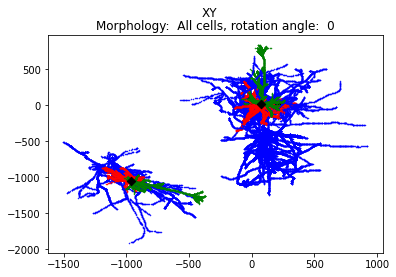

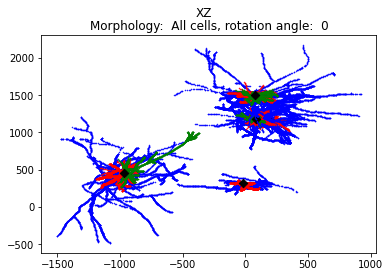

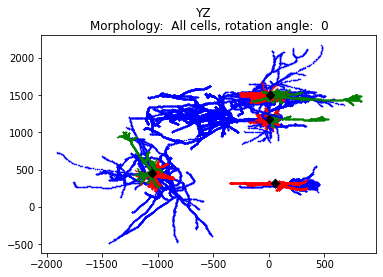

In [57]:
# Gather the cells to plot everything together
morphs_all = morphs_inh + morphs_pyr
plot_morphologies(morphs_all, name_morph='All cells', plane = 'XY')
plot_morphologies(morphs_all, name_morph='All cells', plane = 'XZ')
plot_morphologies(morphs_all, name_morph='All cells', plane = 'YZ')

### 7. Plot in 3D

In [58]:
!pip install plotly

Defaulting to user installation because normal site-packages is not writeable


In [59]:
def morph_get_all_points(morph):
    pts = morph.soma.center.copy()
    for n in morph.neurites:
        pts = np.vstack((pts,n.points[:,[0,1,2]]))
    return pts

def cylinder(r, h, a =0, nt=100, nv =50):
    """
    parametrize the cylinder of radius r, height h, base point a
    """
    theta = np.linspace(0, 2*np.pi, nt)
    v = np.linspace(a, a+h, nv )
    theta, v = np.meshgrid(theta, v)
    x = r*np.cos(theta)
    y = r*np.sin(theta)
    z = v
    return x, y, z

In [60]:
# From https://stackoverflow.com/a/53445592
# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

data = []

# Overimpose somas
somas = np.array([m.soma.center for m in morphs_all])
trace = go.Scatter3d(
    x=somas[:,0],  # <-- Put your data instead
    y=somas[:,1],  # <-- Put your data instead
    z=somas[:,2],  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 5,
        'opacity': 1.0,
        'color': 'black'
    }
)
data.append(trace)


# Plot total cylinder column
# From https://community.plotly.com/t/basic-3d-cylinders/27990
x_cyl, y_cyl, z_cyl = cylinder(volume_pyr[0], volume_pyr[2])

center=[0,0,1041] #center of the cylinder on x=0, y=0 and z=2082/2=1041
trace = go.Surface(
    x=x_cyl + center[0],
    y=y_cyl + center[1],
    z=z_cyl + center[2] - volume_pyr[2]/2,
    opacity = 0.3,
    showscale = False
)
data.append(trace)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

On this 3D plots, we can see that all the somas are correctly inside the cyclinder. 

In [61]:
# From https://stackoverflow.com/a/53445592
# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

colors = ['red','red','blue','magenta','cyan']

data = []
for i,m in enumerate(morphs_all):
    pts = morph_get_all_points(m)
    # Configure the trace.
    trace = go.Scatter3d(
        x=pts[:,0],  # <-- Put your data instead
        y=pts[:,1],  # <-- Put your data instead
        z=pts[:,2],  # <-- Put your data instead
        mode='markers',
        marker={
            'size': 1,
            'opacity': 1.0,
            'color': colors[i]
        }
    )
    data.append(trace)

# Overimpose somas
somas = np.array([m.soma.center for m in morphs_all])
trace = go.Scatter3d(
    x=somas[:,0],  # <-- Put your data instead
    y=somas[:,1],  # <-- Put your data instead
    z=somas[:,2],  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 5,
        'opacity': 1.0,
        'color': 'black'
    }
)
data.append(trace)


# Plot total cylinder column
# From https://community.plotly.com/t/basic-3d-cylinders/27990
x_cyl, y_cyl, z_cyl = cylinder(volume_pyr[0], volume_pyr[2])

center=[0,0,1041] #center of the cylinder on x=0, y=0 and z=2082/2=1041
trace = go.Surface(
    x=x_cyl + center[0],
    y=y_cyl + center[1],
    z=z_cyl + center[2] - volume_pyr[2]/2,
    opacity = 0.3,
    showscale = False
)
data.append(trace)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

On this second plot, there are the five neurons. And, as expected, on the top part of the cylinder which corresponds to the layer I there is no pyramidal soma.

## Ex4. Synaptic Pruning

<font size='3'> Your task is to implement the synapse pruning algorithm from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4597796/ using the number of appositions for a particular EXC-INH connection type provided below, bouton density of 0.2 and a 10^5 scaling factor for calculating the post-pruning bouton density.  After each step, plot a histogram of synapses per connection. At the end, represent the results with two histograms, one histogram of synapses per active connection, and one of synapses per reserve connection. Please note that as the data are made up, you should not expect to see the same results as in the paper. [2.5 pts]

In [16]:
import numpy as np

appositions = np.concatenate((np.ones(6300),2*np.ones(5400),3*np.ones(4750),4*np.ones(3800),5*np.ones(3000),\
                              6*np.ones(2500),7*np.ones(2000),8*np.ones(1700),9*np.ones(1600),10*np.ones(1500),\
                              11*np.ones(1200),12*np.ones(1000),13*np.ones(800),14*np.ones(800),15*np.ones(700),\
                              16*np.ones(600),17*np.ones(550),18*np.ones(500),19*np.ones(450),20*np.ones(400)))

appositions = appositions.astype(int)

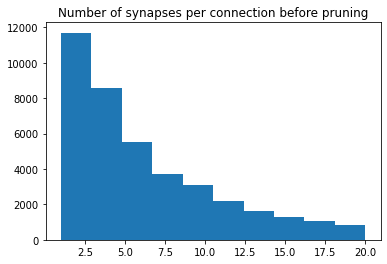

In [3]:
plt.figure()
plt.hist(appositions)
plt.title("Number of synapses per connection before pruning")
plt.show()

#### Defining and computing useful parameters

In [157]:
ms = (6300 + 5400 + 4750 + 3800 + 3000 + 2500 + 2000 + 1700 + 1600 + 1500 + 1200 + 1000 + 800 + 800 + 700 + 600 + 550 + 500 + 450 + 400)/20

CV = 0.33
Bd = 0.2
scaling_factor = 10**5

Sm = 9*np.sqrt(ms-1)-2
print(Sm)

Ssd = CV*Sm
print(Ssd)

p = 1/ms
print(p)

p_pr = 1/(Ssd + 0.5)
print(p_pr)

f1 = (p/(1-p))*((1-p_pr)/p_pr)
print(f1)

398.1206068174945
131.37980024977318
0.0005056890012642225
0.007582662379728012
0.06621796116861785


#### First step pruning : general pruning

In [24]:
#We generate a random number from 0 to 1 for each synapse to compare against f1.
# As the value I computed for f1 is wrong (>1) I will assume that f1 = 0.5. 

appositions_step1 = appositions.copy()

for k in range(len(appositions)) :
    R = np.random.uniform(0,1)
    if R < f1 :
        appositions_step1[k] = 0

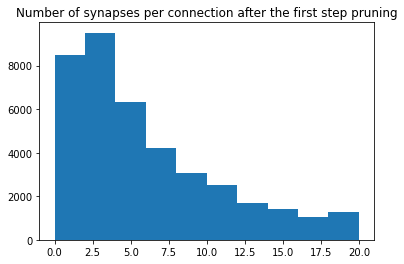

In [25]:
plt.figure()
plt.hist(appositions_step1)
plt.title("Number of synapses per connection after the first step pruning")
plt.show()

#### Second step pruning : multi-synapse pruning

In [160]:
mu2 = 0.5 + Sm - Ssd
print(mu2)

for k in range(1, 21) :
    Ns = np.count_nonzero(appositions_step1 == k)
    R = np.random.uniform(0,1)       
    if R < 1/(1 + np.exp(-16/(mu2*(Ns-mu2)))) :
        print(f'connection {k} inactive')
    else :
        print(f'connection {k} active')

267.2408065677213
connection 1 active
connection 2 active
connection 3 inactive
connection 4 inactive
connection 5 active
connection 6 inactive
connection 7 active
connection 8 inactive
connection 9 inactive
connection 10 active
connection 11 inactive
connection 12 active
connection 13 active
connection 14 active
connection 15 inactive
connection 16 active
connection 17 active
connection 18 inactive
connection 19 inactive
connection 20 active


Removing all inactive connections from the appositions list : connections 3, 4, 6, 8, 9, 11, 15, 18, 19

Keeping all active connections from the appositions list : connections 1, 2, 5, 7, 10, 12, 13, 14, 16, 17, 20

In [161]:
appositions_step2 = np.concatenate((appositions_step1[0:11699], appositions_step1[20250:23249], appositions_step1[25750:27749], appositions_step1[31050:32549], appositions_step1[33750:36349], appositions_step1[37050:38199], appositions_step1[39150:39549]))

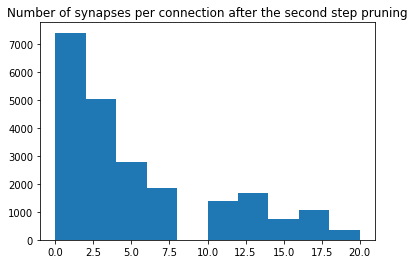

In [163]:
plt.figure()
plt.hist(appositions_step2)
plt.title("Number of synapses per connection after the second step pruning")
plt.show()

#### Third step pruning : plasticity pruning

In [156]:
active_connections = [3, 4, 6, 7, 12, 14, 15, 16, 17, 19, 20]

for k in active_connections :
    R = np.random.uniform(0,1)
    B2 = np.count_nonzero(appositions_step2 == k)/scaling_factor
    a3 = Bd/B2 #There is an issue because a3 is supposed to be less than 1, I think this is because I misunderstood how to compute B2
    if R < a3 :
        print(f'connection {k} inactive')
    else :
        print(f'connection {k} active')

connection 3 inactive
connection 4 inactive
connection 6 inactive
connection 7 inactive
connection 12 inactive
connection 14 inactive
connection 15 inactive
connection 16 inactive
connection 17 inactive
connection 19 inactive
connection 20 inactive


We create a list for the reserve connections : connections 1, 2, 5, 8, 9, 10, 11, 13 and 18

#### Plotting the number of synapses per reserve connections

In [166]:
reserve_connections = appositions_step1[~np.isin(appositions_step1,appositions_step2)]

In [167]:
reserve_connections

array([ 3,  3,  3, ..., 19, 19, 19])

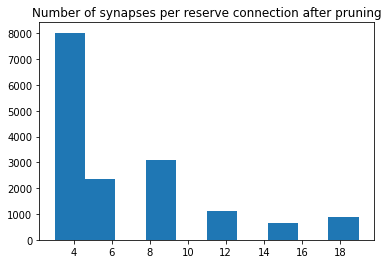

In [168]:
plt.figure()
plt.hist(reserve_connections)
plt.title("Number of synapses per reserve connection after pruning")
plt.show()